<a href="https://colab.research.google.com/github/Ravi-Poddar26/colab/blob/master/PCA_explain.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
martininf1n1ty_mnist100_path = kagglehub.dataset_download('martininf1n1ty/mnist100')

print('Data source import complete.')


In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/mnist100/mnist_compressed.npz


In [ ]:
import numpy as np

# Loading data from the 'mnist_compressed.npz' file
data = np.load('/kaggle/input/mnist100/mnist_compressed.npz')

# Reading variables containing the data
X_test, y_test, X_train, y_train =  data['test_images'], data['test_labels'], data['train_images'], data['train_labels']


In [ ]:
print(data.files)

['train_images', 'train_labels', 'test_images', 'test_labels']


In [ ]:
X_train.shape

(60000, 28, 56)

In [ ]:
X_train = X_train.reshape(X_train.shape[0], -1)

In [ ]:
X_train.shape

(60000, 1568)

In [ ]:
y_train.shape

(60000,)

In [ ]:
X_test.shape

(10000, 28, 56)

In [ ]:
X_test = X_test.reshape(X_test.shape[0], -1)

In [ ]:
X_test.shape

(10000, 1568)

In [ ]:
y_test.shape

(10000,)

In [ ]:
import sklearn
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
knn = KNeighborsClassifier()

In [ ]:
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [ ]:
import time
start = time.time()
y_pred = knn.predict(X_test)
print(time.time()-start)

34.85452127456665


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test, y_pred)

0.6843

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [ ]:
#pca
X_train_trf = scaler.fit_transform(X_train)
X_test_trf = scaler.transform(X_test)

In [ ]:
X_train_trf

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [ ]:
X_train_trf.shape

(60000, 1568)

In [ ]:
#pca
from sklearn.decomposition import PCA
pca = PCA(n_components=200)

In [ ]:
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [ ]:
X_train_trf.shape

(60000, 200)

In [ ]:
knn = KNeighborsClassifier()

In [ ]:
knn.fit(X_train_trf,y_train)

KNeighborsClassifier()

In [ ]:
y_pred = knn.predict(X_test_trf)

In [ ]:
accuracy_score(y_test,y_pred)

0.7608

In [ ]:
for i in range(1,1567):
    pca = PCA(n_components=i)
    X_train_trf = pca.fit_transform(X_train)
    X_test_trf = pca.transform(X_test)
    knn = KNeighborsClassifier()
    knn.fit(X_train_trf, y_train)
    y_pred = knn.predict(X_test_trf)
    print(accuracy_score(y_test,y_pred))

In [ ]:
#transforming to a 2D coordinate system
pca = PCA(n_components = 2)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [ ]:
X_train_trf

array([[-482.94258444,  856.76529246],
       [-827.67004475, -596.88690034],
       [-446.38192231,  486.03786815],
       ...,
       [-338.48988627,  531.74864023],
       [ 375.20478488,   -3.46373234],
       [ 311.68956713,  564.54698883]])

In [ ]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter(x=X_train_trf[:,0],
                   y=X_train_trf[:,1],
                   color=y_train_trf,
                   color_discrete_sequence=px.colors.qualitative.G10
                   )
fig.show()

In [ ]:
#transforming in 3d
pca = PCA(n_components=3)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [ ]:
X_train_trf

array([[-482.6986973 ,  856.88831579, -327.35994497],
       [-827.83019334, -596.8412795 ,  -30.92351332],
       [-446.75409825,  486.27377828,  614.15488377],
       ...,
       [-339.39790284,  531.73435108, -313.39715646],
       [ 375.49407039,   -3.68944727, -281.96266649],
       [ 311.70566013,  564.53029198,  635.85360244]])

In [ ]:
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(x=X_train_trf[:,0],y=X_train_trf[:,1],z=X_train_trf[:,2],
                   color = y_train_trf)
fig.update_layout(
    margin=dict(l=20,r=20,t=20,b=20)
)
fig.show()

In [ ]:
#transforming in 4d
pca = PCA(n_components=4)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [ ]:
X_train_trf

array([[-482.62579598,  856.76617325, -326.53357291,  -75.16349294],
       [-827.94029471, -596.62319144,  -33.77393248,  484.17718557],
       [-446.79660109,  486.29426118,  614.58486865, -511.47910119],
       ...,
       [-339.38149214,  531.73465426, -314.54254276,  436.22961578],
       [ 375.6165128 ,   -3.89790547, -280.02101088,  735.69978068],
       [ 311.8538692 ,  564.27143448,  636.68364381, -153.12770556]])

In [ ]:
import plotly.express as px

y_train_trf = y_train.astype(str)

fig = px.scatter_3d(
    x=X_train_trf[:,0],
    y=X_train_trf[:,1],
    z=X_train_trf[:,2],
    color=X_train_trf[:,3],   # 4th dimension
)

fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20)
)

fig.show()


In [ ]:
#transforming in 5d
pca = PCA(n_components=5)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [ ]:
X_train_trf

array([[-482.67012651,  856.81270931, -326.99754726,  -75.90904101,
        -561.95974704],
       [-827.93234727, -596.73975428,  -33.38909667,  484.88944826,
          -2.99620447],
       [-446.78513431,  486.32241947,  614.75666118, -510.87856765,
         138.87620632],
       ...,
       [-339.28598323,  531.65742537, -313.26013388,  437.62354507,
        -309.03570619],
       [ 375.62106033,   -3.87130902, -280.63998816,  735.37881522,
         347.32121268],
       [ 311.89658376,  564.33376751,  636.03933331, -155.78548057,
         124.78656865]])

In [ ]:
import plotly.express as px
import numpy as np

y_train_trf = y_train.astype(str)

# Normalize size dimension
size_values = X_train_trf[:,4]
size_values = (size_values - size_values.min()) / (size_values.max() - size_values.min()) * 20

fig = px.scatter_3d(
    x=X_train_trf[:,0],
    y=X_train_trf[:,1],
    z=X_train_trf[:,2],
    color=X_train_trf[:,3],
    size=size_values,
)

fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20)
)

fig.show()


In [ ]:
pca.explained_variance_
#eigen values

array([337273.10256335, 328676.23244656, 244814.99464152, 241807.23790689,
       213754.60530776])

In [ ]:
pca.components_
#eigen vectors

array([[-1.68956636e-18,  7.27848600e-17, -9.56779732e-18, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [ 1.11408121e-18,  6.35141384e-17, -7.49172647e-18, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [ 1.11398546e-16,  1.23709715e-16, -3.14544514e-17, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 9.52851792e-17, -2.75435456e-17, -2.24761474e-17, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [ 9.19284037e-17, -1.22977564e-16, -1.75125311e-17, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00]])

In [ ]:
pca.components_.shape

(5, 1568)

In [ ]:
#transforming in 3d
pca = PCA(n_components=3)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [ ]:
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(x=X_train_trf[:,0],y=X_train_trf[:,1],z=X_train_trf[:,2],
                   color = y_train_trf)
fig.update_layout(
    margin=dict(l=20,r=20,t=20,b=20)
)
fig.show()

In [ ]:
pca.explained_variance_
#eigen values

array([337273.0982736 , 328676.21941083, 244810.17565375])

In [ ]:
pca.components_
#eigen vector

array([[-2.22160108e-17,  8.46480038e-18,  3.18877635e-19, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [-1.31560522e-17,  4.01485157e-18,  5.10944578e-19, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [ 4.88230660e-17, -6.02123931e-17,  2.65123000e-18, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00]])

In [ ]:
pca.components_.shape


(3, 1568)

In [ ]:
#finding optimum number of principle componen ts
pca.explained_variance_ratio_

array([0.04924232, 0.04798717, 0.03574261])

In [ ]:
#transforming in 3d
pca = PCA(n_components=None)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [ ]:
pca.explained_variance_.shape

(1568,)

In [ ]:
pca.components_.shape

(1568, 1568)

In [ ]:
pca.explained_variance_ratio_

array([4.92423225e-02, 4.79871680e-02, 3.57433201e-02, ...,
       9.30750061e-36, 3.87046950e-36, 4.36151475e-37])

In [ ]:
np.cumsum(pca.explained_variance_ratio_)

array([0.04924232, 0.09722949, 0.13297281, ..., 1.        , 1.        ,
       1.        ])

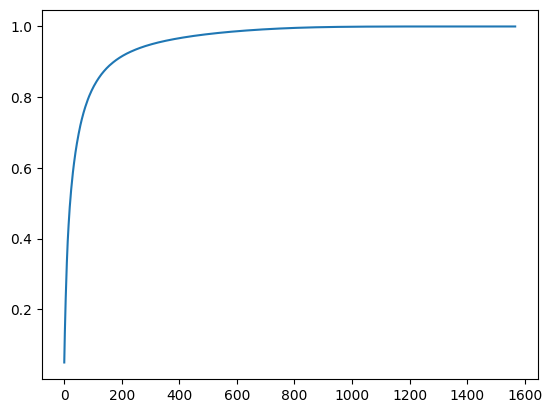

In [ ]:
import matplotlib.pyplot as plt
plt.plot(np.cumsum(pca.explained_variance_ratio_))